In [1]:
# notebook formatter
import jupyter_black

jupyter_black.load()

In [13]:
import os
import glob
import pandas as pd
from scegot import scEGOT

In [3]:
DATASET_INPUT_ROOT_PATH = os.path.join(os.getcwd(), "dataset/input/")

In [7]:
RANDOM_STATE = 2022
PCA_N_COMPONENTS = 30
GMM_CLUSTER_NUMBERS = [1, 2, 4, 5, 5]
UMAP_N_NEIGHBORS = 1000
UMAP_N_COMPONENTS = 2
DAY_NAMES = ["day 0", "day 0.5", "day 1", "day 1.5", "day 2"]

In [35]:
input_file_paths = sorted(glob.glob(f"{DATASET_INPUT_ROOT_PATH}usedataSmall/*.csv"))
input_data = [
    pd.read_csv(input_file_path, index_col=0) for input_file_path in input_file_paths
]
print(f"number of days: {len(input_data)}")
print("shape of each day's data:")
for i, data in enumerate(input_data):
    print(f"    {DAY_NAMES[i]}: {data.shape}")
print("data example: ")
input_data[0].head()

number of days: 5
shape of each day's data:
    day 0: (4943, 2000)
    day 0.5: (1981, 2000)
    day 1: (551, 2000)
    day 1.5: (2562, 2000)
    day 2: (1753, 2000)
data example: 


,APOA1,ACTC1,CST1,KRT19,CALCB,GAL,CRH,APOA2,PLA2G2A,CTSV,...,PRICKLE1,RPL39L,PRR13,SYNE2,LOX,BTG2,FXYD4,YY1,AKR1D1,ZFHX3
iM_AAACCCACAACAACAA-1,0,5,0,23,0,105,0,0,0,9,...,2,18,4,11,0,0,0,17,0,0
iM_AAACGAAAGCTAGTTC-1,1,21,0,28,1,37,0,0,0,11,...,1,14,9,3,0,4,0,15,0,2
iM_AAACGAATCCTGCCAT-1,0,1,0,15,0,236,0,0,0,6,...,0,14,8,3,0,1,0,9,0,2
iM_AAACGAATCGACGATT-1,0,31,1,9,0,18,0,0,0,9,...,1,5,9,6,0,0,0,13,0,1
iM_AAACGAATCGCGGTAC-1,0,18,0,5,0,61,0,0,0,2,...,0,8,5,2,0,0,0,5,0,0


In [36]:
tf_gene_names = (
    pd.read_csv(
        f"{DATASET_INPUT_ROOT_PATH}TF_genes/TFgenes_name.csv", header=None, index_col=0
    )
    .T["cell"]
    .values
)
tf_gene_names

array(['ZBTB8B', 'GSX2', 'TBX2', ..., 'NME2', 'ZNF488', 'ZNF280B'],
      dtype=object)

# Tutorial

In [18]:
scegot = scEGOT(
    input_data,
    PCA_N_COMPONENTS,
    GMM_CLUSTER_NUMBERS,
    ["day 0", "day 0.5", "day 1", "day 1.5", "day 2"],
    verbose=True,
    umi_norm=1e5,
)

## Preprocess

In [19]:
%%time
X, pca_model = scegot.preprocess(RANDOM_STATE, RANDOM_STATE)

Ex. X_new = screcode.RECODE(fast_algorithm=False).fit_transform(X)


Applying scRECODE...
start RECODE for scRNA-seq
end RECODE for scRNA-seq
log: {'seq_target': 'RNA', '#significant genes': 1987, '#non-significant genes': 10, '#silent genes': 0, 'ell': 492, 'Elapsed time': '0h 0m 17s 201ms'}
Applying UMI normalization...
Applying log1p normalization...
Applying PCA...
	sum of explained_variance_ratio = 69.68427484975997
CPU times: user 2min 35s, sys: 3.65 s, total: 2min 39s
Wall time: 26.2 s


## GMM

### PCA ver.

In [20]:
%%time
gmm_labels, gmm_models = scegot.fit_predict_gmm(random_state=RANDOM_STATE)

100%|██████████| 5/5 [05:10<00:00, 62.08s/it]

CPU times: user 33min 40s, sys: 52.2 s, total: 34min 32s
Wall time: 5min 10s


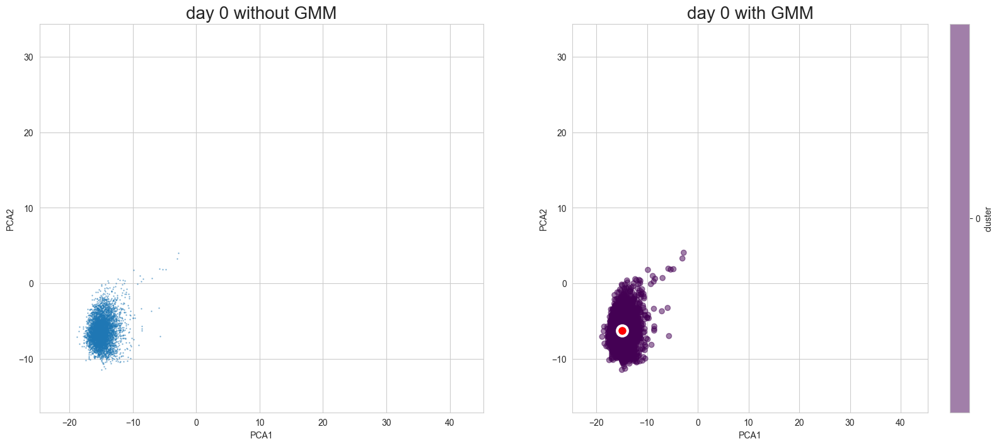

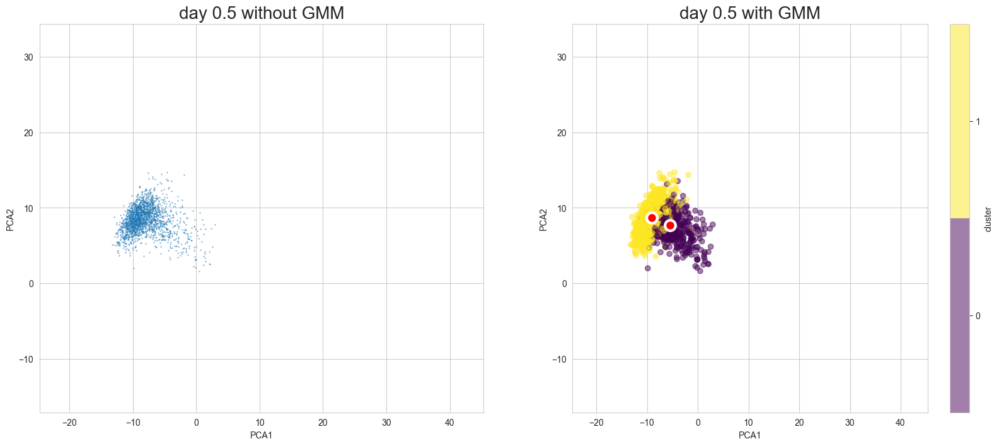

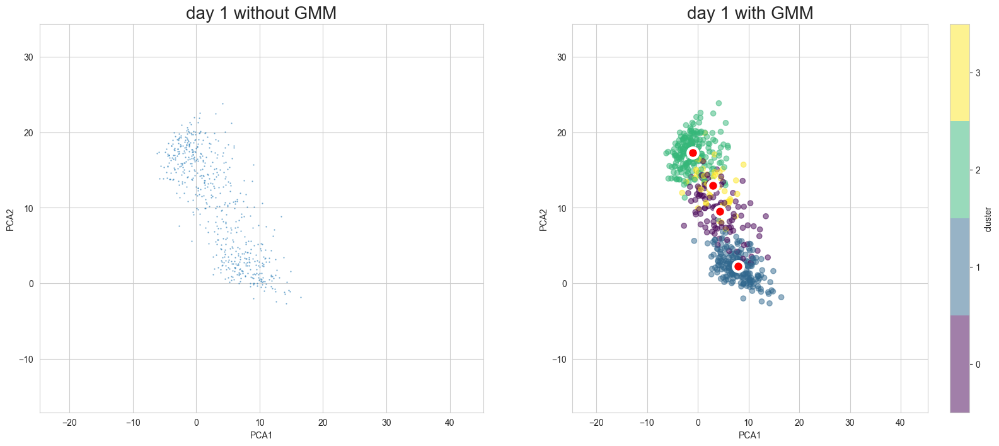

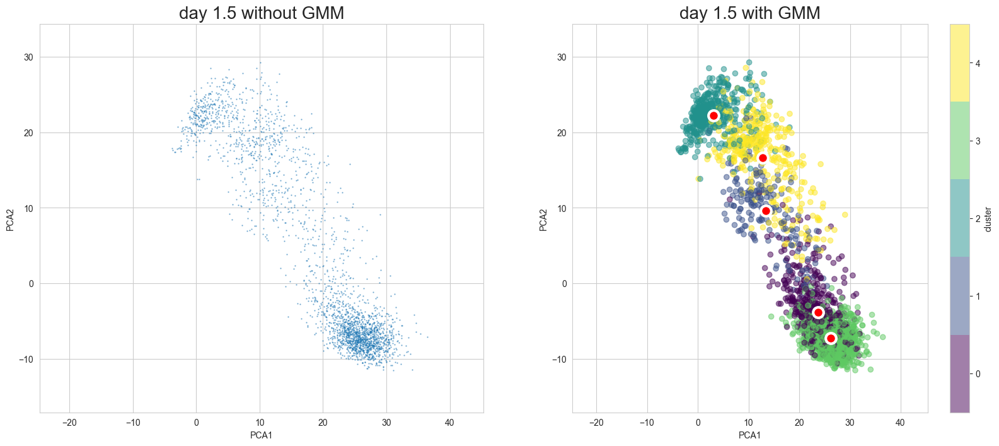

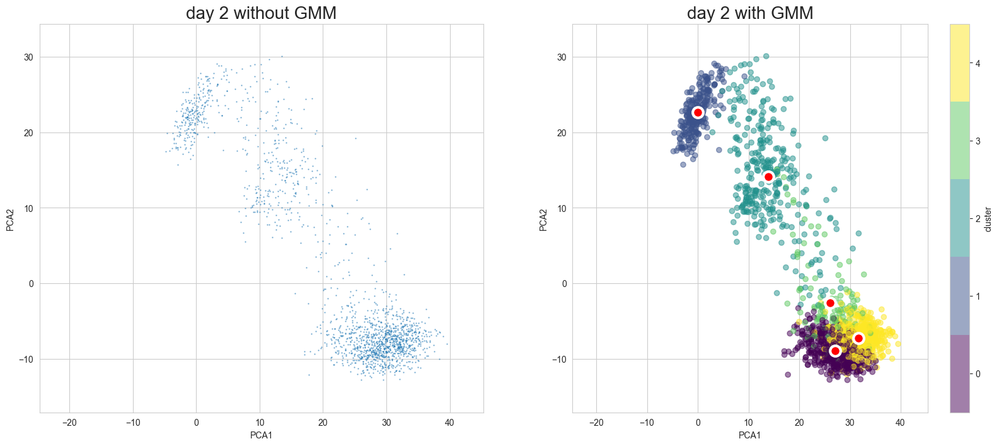

In [23]:
scegot.plot_gmm_predictions(
    plot_gmm_means=True,
    figure_titles_without_gmm=[f"{name} without GMM" for name in DAY_NAMES],
    figure_titles_with_gmm=[f"{name} with GMM" for name in DAY_NAMES],
    cmap="viridis",
    save=True,
    save_paths=[f"./output/library/PCA_GMM_figure_{name}.png" for name in DAY_NAMES],
)

### UMAP ver.

In [24]:
%%time
scegot.umap_n_components = UMAP_N_COMPONENTS
scegot.umap_n_neighbors = UMAP_N_NEIGHBORS
X_2, umap_model = scegot.apply_umap(random_state=RANDOM_STATE)

CPU times: user 3min 9s, sys: 2.6 s, total: 3min 11s
Wall time: 1min 8s


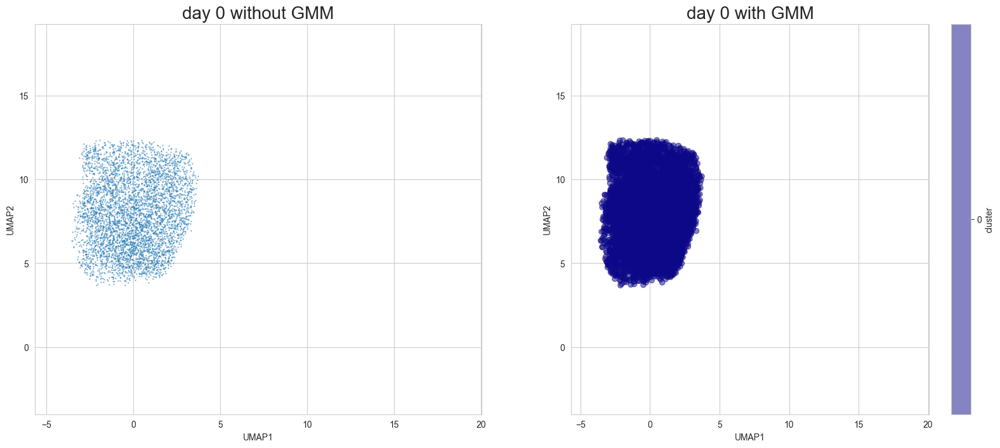

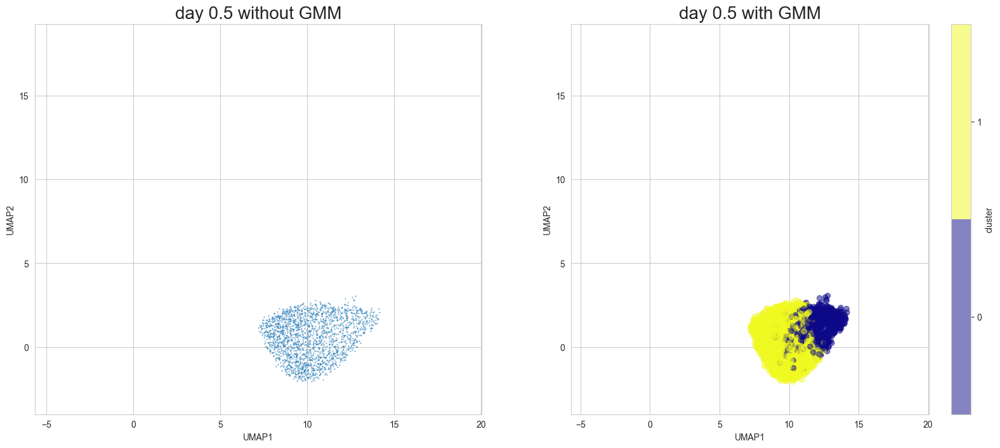

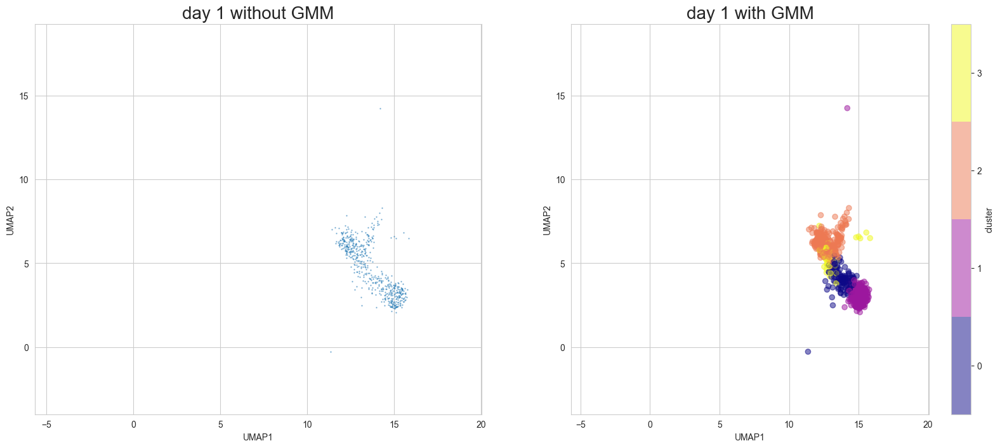

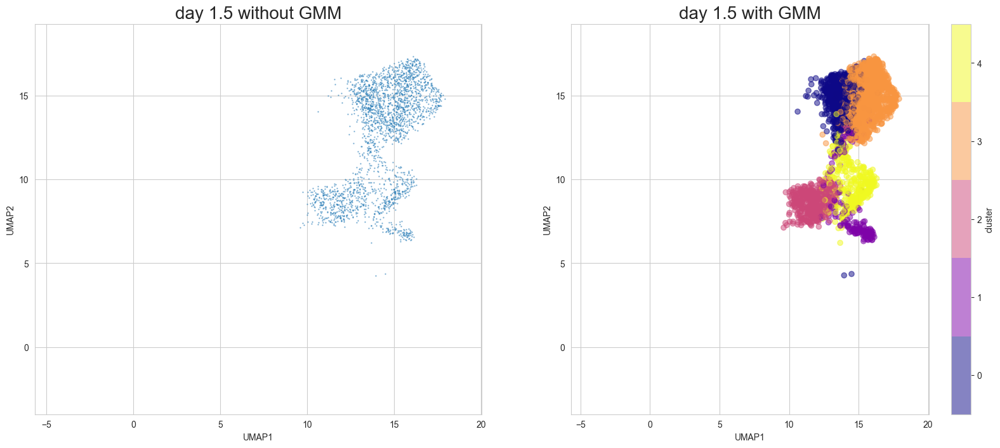

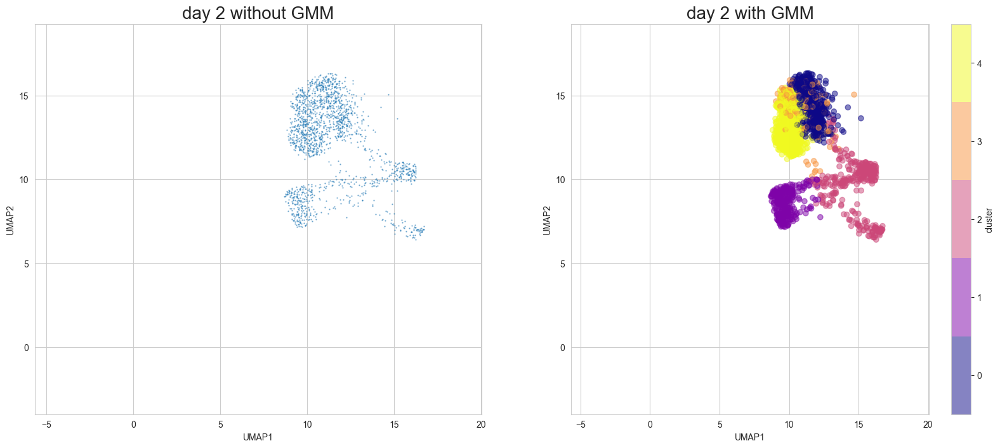

In [25]:
scegot.plot_gmm_predictions(
    mode="UMAP",
    figure_titles_without_gmm=[f"{name} without GMM" for name in DAY_NAMES],
    figure_titles_with_gmm=[f"{name} with GMM" for name in DAY_NAMES],
    cmap="plasma",
    save=True,
    save_paths=[f"./output/library/UMAP_GMM_figure_{name}.png" for name in DAY_NAMES],
)

## Cell State

### Movie

In [26]:
scegot.animate_cell_state(
    cmap="rainbow",
    save=True,
    save_path="./output/library/cell_state_video.gif",
)

  0%|          | 0/11 [00:00<?, ?it/s]/Users/momo/.pyenv/versions/3.8.16/envs/scEGOT/lib/python3.8/site-packages/ot/bregman.py:1112: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn("Sinkhorn did not converge. You might want to "
100%|██████████| 11/11 [00:18<00:00,  1.67s/it]


### Graph

In [27]:
cluster_names = scegot.generate_cluster_names_with_day()

### PCA ver.

In [37]:
scegot.plot_cell_state_graph(
    cluster_names,
    tf_gene_names,
    save=True,
    save_path="./output/library/cell_state_graph_PCA.png",
)

/Users/momo/.pyenv/versions/3.8.16/envs/scEGOT/lib/python3.8/site-packages/ot/bregman.py:1112: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn("Sinkhorn did not converge. You might want to "
/Users/momo/dev/ASHBi/scEGOT/scEGOT/scEGOT/scegot.py:583: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_upgenes = df_upgenes.append(upgenes, ignore_index=True)
/Users/momo/dev/ASHBi/scEGOT/scEGOT/scEGOT/scegot.py:583: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_upgenes = df_upgenes.append(upgenes, ignore_index=True)
/Users/momo/dev/ASHBi/scEGOT/scEGOT/scEGOT/scegot.py:583: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  

### UMAP ver.

In [38]:
scegot.plot_cell_state_graph(
    cluster_names,
    tf_gene_names,
    mode="UMAP",
    save=True,
    save_path="./output/library/cell_state_graph_UMAP.png",
)

/Users/momo/.pyenv/versions/3.8.16/envs/scEGOT/lib/python3.8/site-packages/ot/bregman.py:1112: UserWarning:

Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.

/Users/momo/dev/ASHBi/scEGOT/scEGOT/scEGOT/scegot.py:583: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/momo/dev/ASHBi/scEGOT/scEGOT/scEGOT/scegot.py:583: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/momo/dev/ASHBi/scEGOT/scEGOT/scEGOT/scegot.py:583: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/momo/dev/ASHBi/scEGOT/scEGOT/scEGOT/scegot.py:583: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

## Fold Change

In [41]:
scegot.plot_fold_change(
    cluster_names,
    tf_gene_names,
    "day 0.5-0",
    "day 0.5-1",
    threshold=1.0,
    save=True,
    save_path="./output/library/fold_change.png",
)

## Pathway

In [43]:
# selected_genes = ['HAND1','FOXF1','MESP1','EOMES']
pathway_names = [
    "day 0-0",
    "day 0.5-1",
    "day 1-1",
    "day 1.5-4",
    "day 2-2",
]
selected_genes = ["NANOG", "SOX17", "TFAP2C", "NKX1-2"]
scegot.plot_pathway_gene_expressions(
    cluster_names,
    tf_gene_names,
    pathway_names,
    selected_genes,
    save=True,
    save_path="./output/library/pathway_gene_expressions.png",
)

## Features of single gene

### PCA ver.

In [45]:
gene_name = "NKX1-2"
scegot.plot_pathway_single_gene_2d(
    gene_name,
    save=True,
    save_path="./output/library/single_gene_2d.png",
)

In [46]:
scegot.plot_pathway_single_gene_3d(
    gene_name,
    save=True,
    save_path="./output/library/single_gene_3d.html",
)

### UMAP ver.

In [47]:
gene_name = "NKX1-2"
scegot.plot_pathway_single_gene_2d(gene_name, mode="UMAP")

## Interpolation

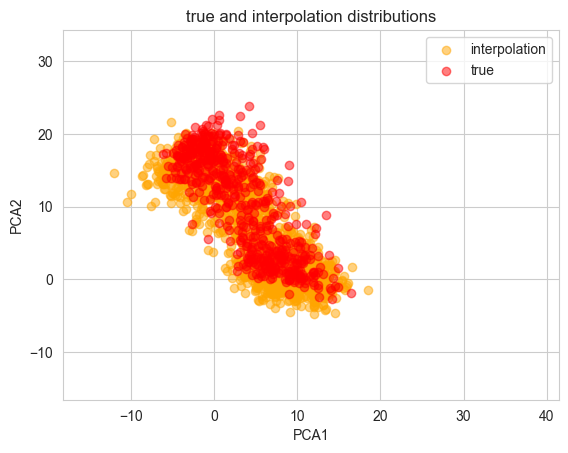

In [50]:
scegot.plot_true_and_interpolation_distributions(
    2,
    plot_source_and_target=False,
    alpha_true=0.5,
    save=True,
    save_path="./output/library/true_interpolation_distributions_without_source_target.png",
)

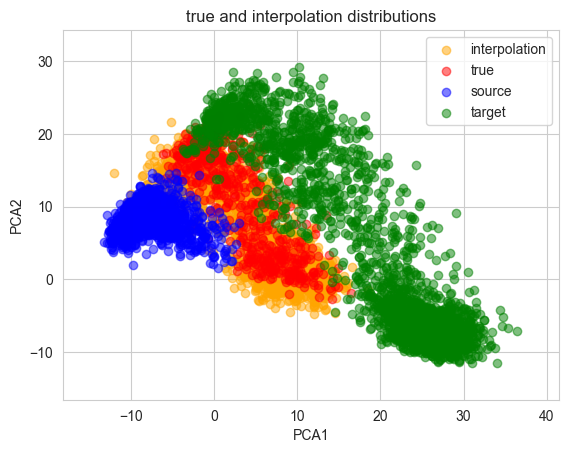

In [51]:
scegot.plot_true_and_interpolation_distributions(
    2,
    alpha_true=0.5,
    save=True,
    save_path="./output/library/true_interpolation_distributions.png",
)